## Data Augmentation Using CycleGAN
The healthy and unhealthy leaf images are generated based on the real healthy and unhealthy leaf images using unparied image-to-image translation model, CycleGAN.

Reference:

https://tmabraham.github.io/UPIT/

https://www.kaggle.com/tanlikesmath/upit-a-package-for-unpaired-img2img-translation

In [1]:
!pip install git+https://github.com/tmabraham/upit.git >/dev/null

  Running command git clone -q https://github.com/tmabraham/upit.git /tmp/pip-req-build-evobh6cv


In [2]:
from upit.data.unpaired import *
from upit.models.cyclegan import *
from upit.train.cyclegan import *
from upit.inference.cyclegan import *
from fastai.vision.all import *

In [3]:
gan_path = Path("/home/ubuntu/PlantVillage/gan_images_potato")
model_path = Path("/home/ubuntu/PlantVillage/model")
image_path = Path("/home/ubuntu/PlantVillage/Potato")

### Loading Data

In [4]:
trainA_path = image_path/"Potato___Early_blight"
trainB_path = image_path/"Potato___healthy"
print(f"There are {len(trainA_path.ls())} unhealthy leaf photos")
print(f"There are {len(trainB_path.ls())} healthy leaf photos")

There are 1000 unhealthy leaf photos
There are 152 healthy leaf photos


In [5]:
IMG_SIZE = 224 # 300

pathA = trainA_path
pathB = trainB_path

dls = get_dls(pathA, pathB, load_size=IMG_SIZE,crop_size=IMG_SIZE)

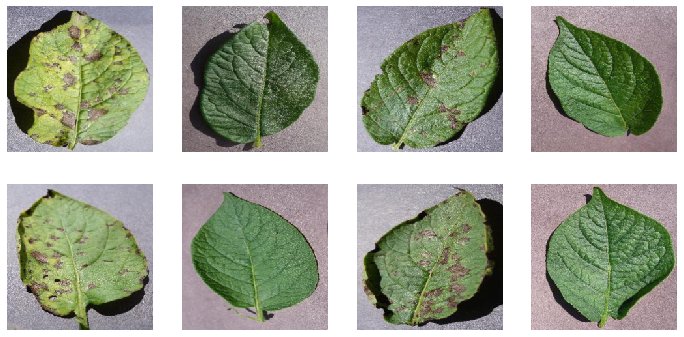

In [6]:
dls.show_batch()

### Defining a Model

In [7]:
# defining the model
cycle_gan = CycleGAN(3, 3, 64, gen_blocks = 5) # gen_block = 3 or 5

In [8]:
learn = cycle_learner(dls, cycle_gan, opt_func = partial(Adam,mom = 0.5,sqr_mom = 0.999), show_img_interval = 8)

### Finding a Learning Rate

/home/ubuntu/anaconda3/envs/pytorch_latest_p37/lib/python3.7/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (G_A) that exists in the learner. Use `self.learn.G_A` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/ubuntu/anaconda3/envs/pytorch_latest_p37/lib/python3.7/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (G_B) that exists in the learner. Use `self.learn.G_B` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/ubuntu/anaconda3/envs/pytorch_latest_p37/lib/python3.7/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (D_A) that exists in the learner. Use `self.learn.D_A` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/

SuggestedLRs(lr_min=4.786300996784121e-05, lr_steep=6.30957365501672e-05)

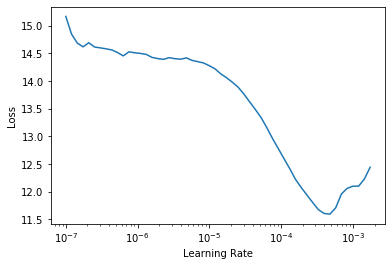

In [9]:
learn.lr_find()

### Training a Model

epoch,train_loss,id_loss_A,id_loss_B,gen_loss_A,gen_loss_B,cyc_loss_A,cyc_loss_B,D_A_loss,D_B_loss,time
0,4.515388,0.731261,0.673315,0.349495,0.323873,1.519773,1.395644,0.239065,0.239065,01:25
1,4.276510,0.591524,0.567954,0.342256,0.356831,1.257858,1.201769,0.222454,0.222454,01:25
2,4.062632,0.547334,0.537817,0.354379,0.361826,1.187423,1.152812,0.214797,0.214797,01:26
3,3.863666,0.520003,0.501692,0.343357,0.349035,1.138511,1.093354,0.224351,0.224351,01:26
4,3.853980,0.497555,0.484904,0.331694,0.348770,1.110122,1.060028,0.227529,0.227529,01:26
5,4.187696,0.488259,0.491281,0.366079,0.408949,1.118156,1.081584,0.215750,0.215750,01:26
6,3.830160,0.468396,0.475357,0.368147,0.389698,1.058918,1.050939,0.219142,0.219142,01:26
7,3.503046,0.450526,0.428263,0.367710,0.306587,0.983817,0.971683,0.218274,0.218274,01:26
8,3.751076,0.439498,0.427705,0.399388,0.368639,0.992843,0.972670,0.210148,0.210148,01:26
9,3.592059,0.431790,0.418323,0.407936,0.436631,0.987050,0.956783,0.213667,0.213667,01:26


/home/ubuntu/anaconda3/envs/pytorch_latest_p37/lib/python3.7/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (G_A) that exists in the learner. Use `self.learn.G_A` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/ubuntu/anaconda3/envs/pytorch_latest_p37/lib/python3.7/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (G_B) that exists in the learner. Use `self.learn.G_B` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/home/ubuntu/anaconda3/envs/pytorch_latest_p37/lib/python3.7/site-packages/fastai/callback/core.py:50: UserWarning: You are shadowing an attribute (D_A) that exists in the learner. Use `self.learn.D_A` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")
/

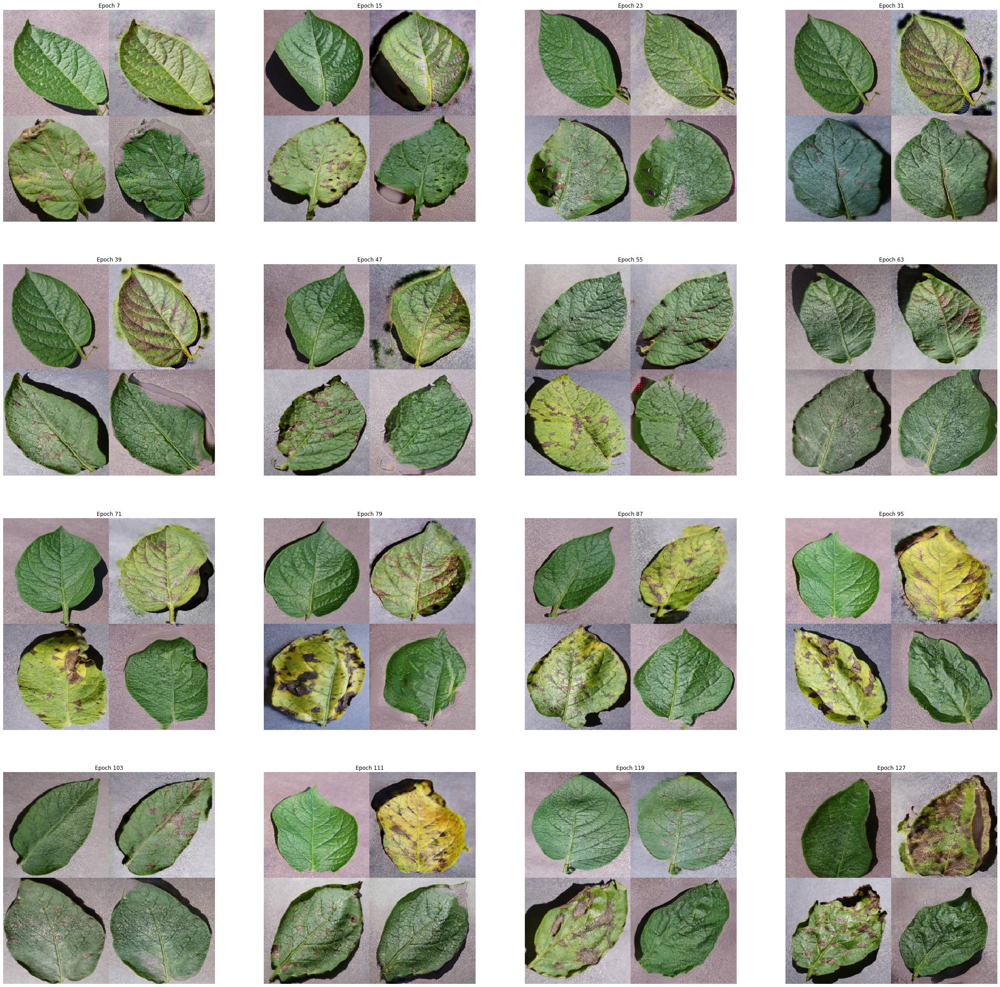

In [10]:
learn.fit_flat_lin(100, 30, 3e-4)

### Reviewing Predictions

In [11]:
b = dls.one_batch()
_,_,preds = learn.get_preds(dl=[b], with_decoded=True)

Text(0.5, 0.98, 'Predictions')

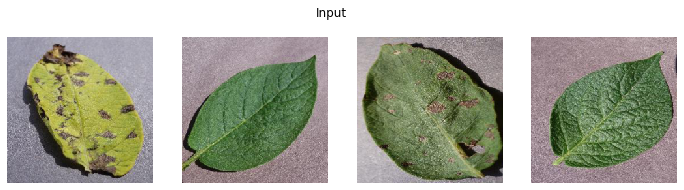

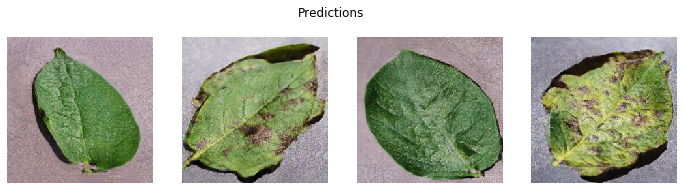

In [12]:
dls.show_batch((b[0], b[1]), max_n=2, show=True)
plt.suptitle('Input')
dls.show_batch((preds[1],preds[0]), max_n=2, show=True)
plt.suptitle('Predictions')

### Saving the Model
The trained model is saved as a PyTorch model file. 

In [14]:
if os.path.exists(model_path/'cyclegan_potato_model.pth'): os.remove(model_path/'cyclegan_potato_model.pth')
learn.save(f'{model_path}/cyclegan_potato_model')
assert os.path.exists(model_path/'cyclegan_potato_model.pth')

### Generating Fake Images
New fake images are generated from images in testA_path and saved to preds_path.

In [15]:
testA_path = gan_path/'test_potato_early_blight'
preds_path = gan_path/'fake_potato_healthy'

In [16]:
get_preds_cyclegan(learn, str(testA_path), preds_path, suffix='jpg')